<a href="https://colab.research.google.com/github/filipabramowicz/ML_AI_course/blob/main/lab_02_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Disclaimer

To be honest, I am not sure what's the definition of done for this lab. The description in the lab notebook says something about creating the model, which I think wasn't described yet (and the recording was stopped when it was described during the meeting), so I will try some data cleaning and data consistency analysis but most probably...

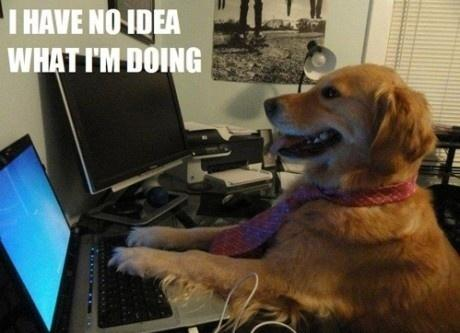

Let's start with downloading the data:

In [ ]:
import gdown
gdown.download('https://drive.google.com/uc?id=1Z74AfhGE64qhyuO9Hgfj56xCJpZHocmA', 'house.zip', quiet=False)

!unzip house.zip

Downloading...
From: https://drive.google.com/uc?id=1Z74AfhGE64qhyuO9Hgfj56xCJpZHocmA
To: /content/house.zip
100%|██████████| 204k/204k [00:00<00:00, 45.2MB/s]

Archive:  house.zip
  inflating: data_description.txt    
  inflating: sample_submission.csv   
  inflating: test.csv                
  inflating: train.csv               


Now, let's load the CSV with training data:

In [ ]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Load traning data
houses = pd.read_csv('train.csv')

Let's check representaiton of different neighborhoods in the data:

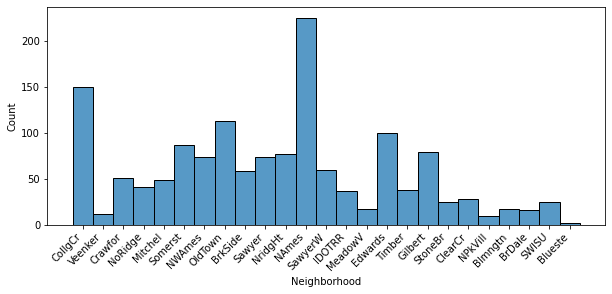

In [ ]:
plt.figure(figsize=(10, 4))
plt.xticks(rotation=45, ha='right')
sns.histplot(x='Neighborhood', data=houses)
plt.show()

In [ ]:
print((houses['Neighborhood'] == 'NAmes').sum())
print((houses['Neighborhood'] == 'CollgCr').sum())

225
150


In [ ]:
print((houses['Neighborhood'] == 'Blueste').sum())
print((houses['Neighborhood'] == 'NPkVill').sum())
print((houses['Neighborhood'] == 'Veenker').sum())

2
9
11


It seems that some neighborhoods, like NAmes (225 occurences) or CollgCr (150 occurrences) are overrepresented while other likes Blues (2 occurences), NPkVill (9 ocurrences) or Veenker (11 ocurrences) are underrepresented.

# Data Integrity Analysis

## Looking for nulls

Let's look for null values in the columns - let's print only the column names in which there are some null values:

In [ ]:
houses.isnull().sum()[houses.isnull().sum() > 0]


LotFrontage      259
Alley           1369
MasVnrType         8
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64

Ok, so now let's check what's the reason there is null in those columns - is it intented/by design or is the data corrupt.

Basing on the descriptions in data_description.txt and looking at particualr records we can judge if the NaN is valid value or not.

### LotFrontage

NaN seems to be the valid value, assuming that there may be lots that are not connected to any external road (but having interal road instead). Also number of occurences suggests it is a valid data.



In [ ]:
houses[houses['LotFrontage'].isnull()].iloc[0:3, :]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
7,8,60,RL,NaN,10382,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,Shed,350,11,2009,WD,Normal,200000
12,13,20,RL,NaN,12968,Pave,NaN,IR2,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,144000
14,15,20,RL,NaN,10920,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,GdWo,NaN,0,5,2008,WD,Normal,157000


Let's check how the histogram of values for this column

<AxesSubplot:xlabel='LotFrontage', ylabel='Count'>

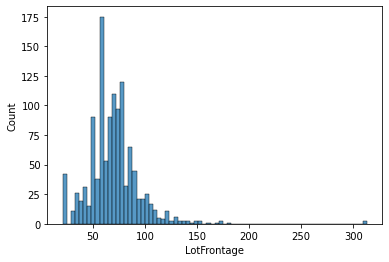

In [ ]:
sns.histplot(x='LotFrontage', data=houses)

It seems we may have some outliers in the data. Let's check them:

In [ ]:
houses[houses['LotFrontage'] > 200]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
934,935,20,RL,313.0,27650,Pave,NaN,IR2,HLS,AllPub,...,0,NaN,NaN,NaN,0,11,2008,WD,Normal,242000
1298,1299,60,RL,313.0,63887,Pave,NaN,IR3,Bnk,AllPub,...,480,Gd,NaN,NaN,0,1,2008,New,Partial,160000


In both examples LotFrontage seems compliant with big LotArea so those values are not mistakes.



### Alley
Accoridng to the descripton NaN seems to be valid value for alley:

In [ ]:
houses[houses['Alley'].isnull()].iloc[0:3, :]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500


Also historgam of values proves data consistency - no other values than Grvl, Pave, or NaN:

<AxesSubplot:xlabel='Alley', ylabel='Count'>

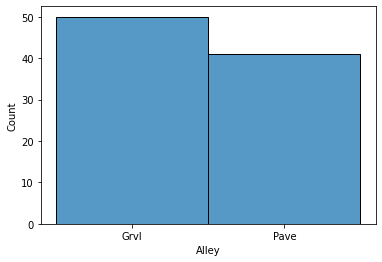

In [ ]:
sns.histplot(x='Alley', data=houses)

### MasVnrType, MasVnrArea

NaN doesn't seem as valid data type for MasVnrType as it has None value.
However NaN seems to be valid value for MasVnrArea (if MasVnrType set to None).

Let's check those rows:

In [ ]:
houses[houses['MasVnrType'].isnull()].iloc[0:8, :].filter(['MasVnrType','MasVnrArea'])

,MasVnrType,MasVnrArea
234,NaN,NaN
529,NaN,NaN
650,NaN,NaN
936,NaN,NaN
973,NaN,NaN
977,NaN,NaN
1243,NaN,NaN
1278,NaN,NaN


Let's check other values used for MasVnrType:

<AxesSubplot:xlabel='MasVnrType', ylabel='Count'>

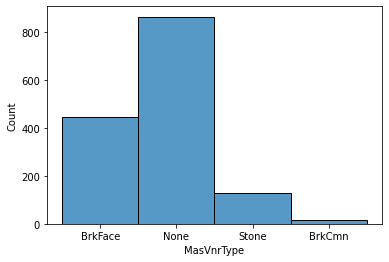

In [ ]:
sns.histplot(x='MasVnrType', data=houses)

Other values are compliant with the definition of this type so those 8 rows are corrupt and should be corrected:

In [ ]:
houses['MasVnrType'].replace({np.nan: 'None'}, inplace=True)
houses[houses['MasVnrType'].isnull()].iloc[0:8, :].filter(['MasVnrType','MasVnrArea'])

,MasVnrType,MasVnrArea


### BsmtQual BsmtCond BsmtExposure BsmtFinType1 BsmtFinType2

Nan is valid value for BsmtQual, BsmtCond, BsmtExposure, BsmtFinType1, BsmtFinType2 according to the description. Let's check that other values are compliant with the definition.

Seems ok for BsmtQual:

<AxesSubplot:xlabel='BsmtQual', ylabel='Count'>

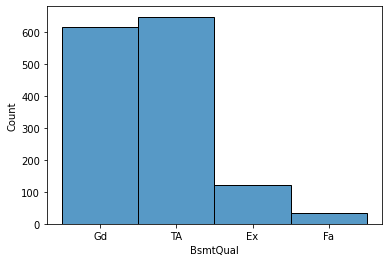

In [ ]:
sns.histplot(x='BsmtQual', data=houses)

Seems ok for BsmtCond:

<AxesSubplot:xlabel='BsmtCond', ylabel='Count'>

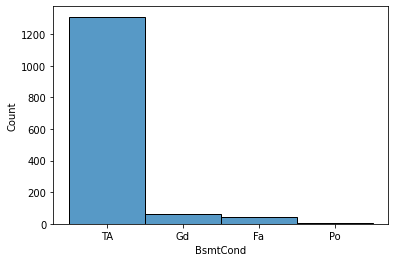

In [ ]:
sns.histplot(x='BsmtCond', data=houses)

Seems ok for BsmtExpoure:

<AxesSubplot:xlabel='BsmtExposure', ylabel='Count'>

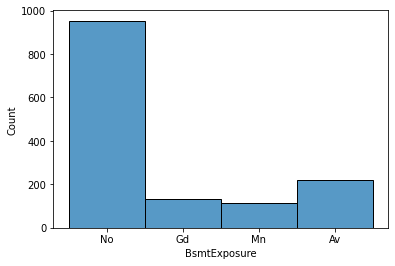

In [ ]:
sns.histplot(x='BsmtExposure', data=houses)

Seems ok for BsmtFinType1:

<AxesSubplot:xlabel='BsmtFinType1', ylabel='Count'>

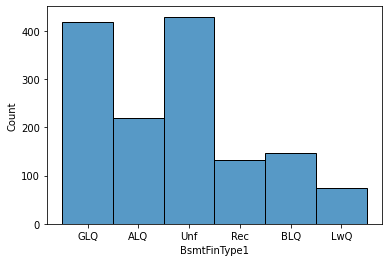

In [ ]:
sns.histplot(x='BsmtFinType1', data=houses)

Seems ok for BsmtFinType2:

<AxesSubplot:xlabel='BsmtFinType2', ylabel='Count'>

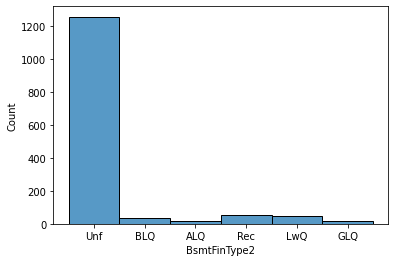

In [ ]:
sns.histplot(x='BsmtFinType2', data=houses)

### Electrical
According to the definition Electrical is categorical value an should be one of: SBrkr, FuseA, FuseF, FuseP, Mix.

Let's check this row:

In [ ]:
houses[houses['Electrical'].isnull()].filter(['Electrical', "Utilities"])

,Electrical,Utilities
1379,NaN,AllPub


It seems that row 1379 is corrupt. We can fix that by removing that row:

In [ ]:
houses = houses.drop(1379)

Now we should no longer see that row:

In [ ]:
houses[houses['Electrical'].isnull()].filter(['Electrical', "Utilities"])

,Electrical,Utilities


Let's check integrity of other values used for electricity:

<AxesSubplot:xlabel='Electrical', ylabel='Count'>

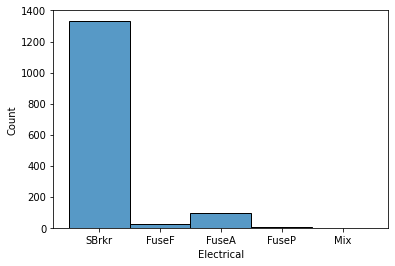

In [ ]:
sns.histplot(x='Electrical', data=houses)

It looks ok.

### Fireplace
It seems NaN is valid value for Fireplace. Let's check that other values are compliant with the definition:

<AxesSubplot:xlabel='FireplaceQu', ylabel='Count'>

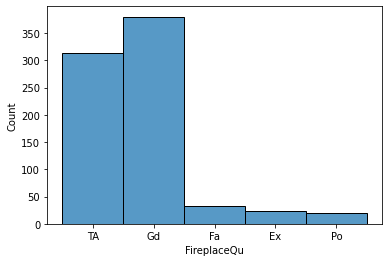

In [ ]:
sns.histplot(x='FireplaceQu', data=houses)

They are ok.

### GarageType GarageYrBlt GarageFinish GarageQual GarageCond
It seems NaN is a valid value for those fields.
Let's check cross-intergrity of those fields:

In [ ]:
houses.query("GarageType.isnull() & GarageYrBlt.isnull() & GarageFinish.isnull() & GarageQual.isnull() & GarageCond.isnull()")

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
39,40,90,RL,65.0,6040,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2008,WD,AdjLand,82000
48,49,190,RM,33.0,4456,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,6,2009,New,Partial,113000
78,79,90,RL,72.0,10778,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,4,2010,WD,Normal,136500
88,89,50,C (all),105.0,8470,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,10,2009,ConLD,Abnorml,85000
89,90,20,RL,60.0,8070,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2007,WD,Normal,123600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1349,1350,70,RM,50.0,5250,Pave,Pave,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,122000
1407,1408,20,RL,NaN,8780,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,MnPrv,NaN,0,3,2009,WD,Normal,112000
1449,1450,180,RM,21.0,1533,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,8,2006,WD,Abnorml,92000
1450,1451,90,RL,60.0,9000,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2009,WD,Normal,136000


When checking the rows which have NaN value for each GarageXXX column we got 81 rows which is compliant with the total number of 81 rows with NaN for each of the columns. It means that those rows are valid and they describe the situation in which there is no Garage within this property.

Let's check other values of GarageType:

<AxesSubplot:xlabel='GarageType', ylabel='Count'>

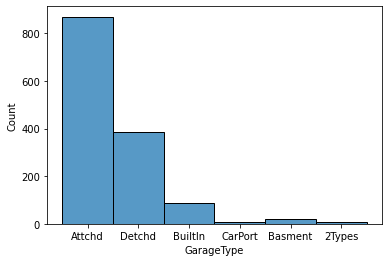

In [ ]:
sns.histplot(x='GarageType', data=houses)

Seems ok.

Let's check other values used for GarageYrBlt:

<AxesSubplot:xlabel='GarageYrBlt', ylabel='Count'>

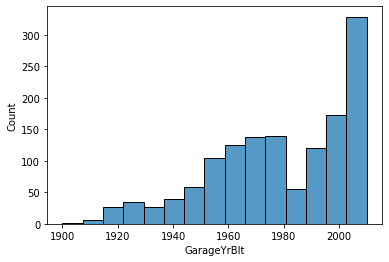

In [ ]:
sns.histplot(x='GarageYrBlt', data=houses)

Let's check values used for GarageFinish:

<AxesSubplot:xlabel='GarageFinish', ylabel='Count'>

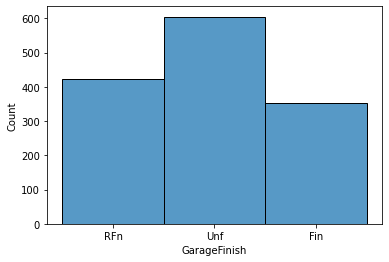

In [ ]:
sns.histplot(x='GarageFinish', data=houses)

Let's check values used for GarageQual:

<AxesSubplot:xlabel='GarageQual', ylabel='Count'>

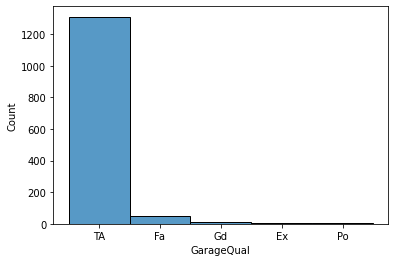

In [ ]:
sns.histplot(x='GarageQual', data=houses)

Seems ok.

Let's check values used for GarageCond:

<AxesSubplot:xlabel='GarageCond', ylabel='Count'>

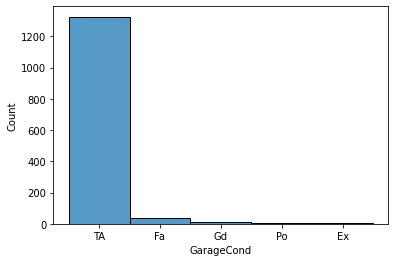

In [ ]:
sns.histplot(x='GarageCond', data=houses)

Seems quite correlated with GarageQual, but we will check that on heat map.

### PoolQC
NaN seems to be valid value for PoolQC but it should be compliant with PoolArea. Let's check that:

In [ ]:
houses[houses['PoolQC'].isnull()].iloc[0:3, :].filter(['PoolQC','PoolArea'])

,PoolQC,PoolArea
0,NaN,0
1,NaN,0
2,NaN,0


So when PoolQC is NaN, PoolArea is 0. Let's look for rows that do not fulfill this condition:

In [ ]:
houses.query("PoolQC.isnull() & PoolArea != 0")

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


Ok, NaNed pool variables are correct. Let's check other values of PoolQC:

<AxesSubplot:xlabel='PoolQC', ylabel='Count'>

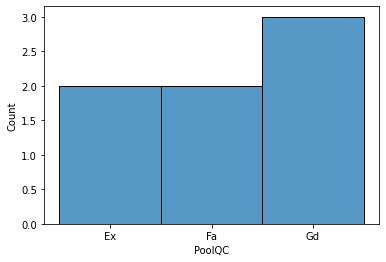

In [ ]:
sns.histplot(x='PoolQC', data=houses)

They are compliant with the definition.

Let's check the histogram for PoolArea:

<AxesSubplot:xlabel='PoolArea', ylabel='Count'>

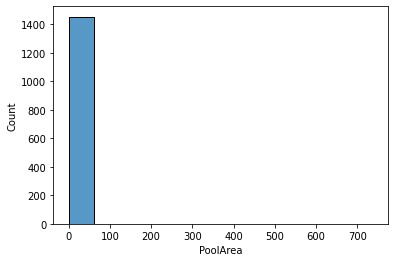

In [ ]:
sns.histplot(x='PoolArea', data=houses)

That's strange, it seems there is no house with the pool. Let's double check that with PoolQC:

In [ ]:
houses[houses['PoolQC'].notnull()].filter(['PoolQC','PoolArea'])

,PoolQC,PoolArea
197,Ex,512
810,Fa,648
1170,Gd,576
1182,Ex,555
1298,Gd,480
1386,Fa,519
1423,Gd,738


Ok, there are some non-NaN values but since majority is 0 they are not visible on the graph. But at least we checked that PoolQC and PoolArea have some sense. We could delete those columns if they were all zeros.

### Fence
Nan seems to be valid value for Fence.

Let's check other values used for Fence:


<AxesSubplot:xlabel='Fence', ylabel='Count'>

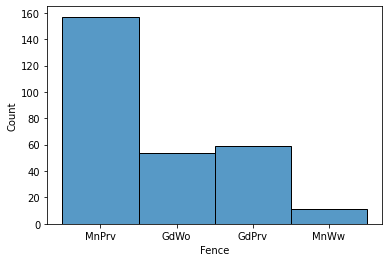

In [ ]:
sns.histplot(x='Fence', data=houses)

It is compliant with the definition.

### MiscFeature
NaN is valid value for MiscFeature. Let's check other values used for MiscFeature:

<AxesSubplot:xlabel='MiscFeature', ylabel='Count'>

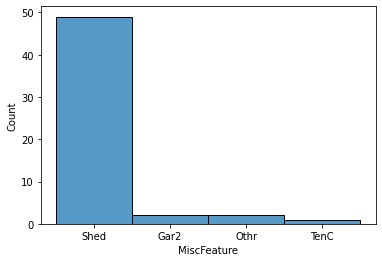

In [ ]:
sns.histplot(x='MiscFeature', data=houses)

It is compliant with the definition.

## Looking for the columns with one value

Let's check if there are columns that have only one value and thus can be reduced:

In [ ]:
houses.columns[houses.nunique() <= 1]

Index([], dtype='object')

No such columns.

We can also check that looking at min and max value of the describe printout:

In [ ]:
houses.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


## Heatmap

Let's generate the hitmap:

<AxesSubplot:>

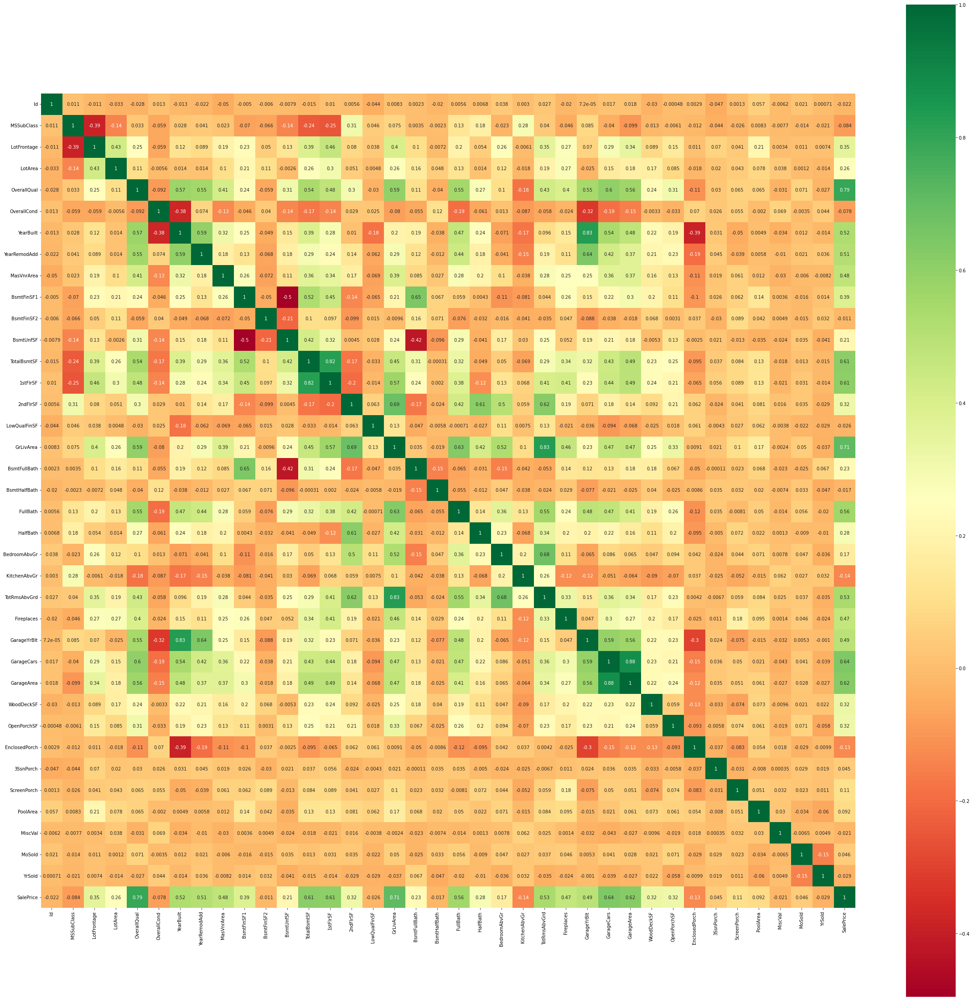

In [ ]:
plt.figure(figsize=(40, 40))
sns.heatmap(houses.corr(), annot=True, square=True, cmap='RdYlGn')

Also not much value provided except from obvious observations that the SalePrice depends mostly on the GrLivArea and OverallQual.

Let's additionally check integrity of those 3 fields:

<AxesSubplot:xlabel='GrLivArea', ylabel='Count'>

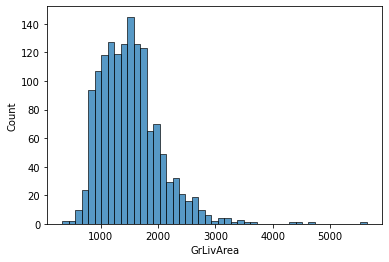

In [ ]:
sns.histplot(x='GrLivArea', data=houses)

GrLilvArea has some outliers, let's check them:

In [ ]:
houses[houses['GrLivArea'] > 4000].filter(['GrLivArea','1stFlrSF', '2ndFlrSF'])

,GrLivArea,1stFlrSF,2ndFlrSF
523,4676,3138,1538
691,4316,2444,1872
1182,4476,2411,2065
1298,5642,4692,950


When compared with square feet of 1st and 2nd floors, the outliers for GrLivArea seem valid.

Let's check the histogram for OverallQual:

<AxesSubplot:xlabel='OverallQual', ylabel='Count'>

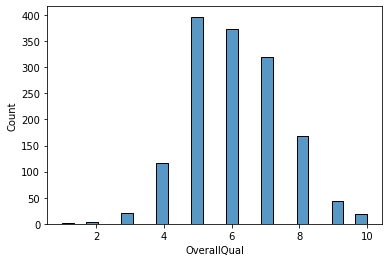

In [ ]:
sns.histplot(x='OverallQual', data=houses)

Seems valid.

Let's check the SalesPrice:

<AxesSubplot:xlabel='SalePrice', ylabel='Count'>

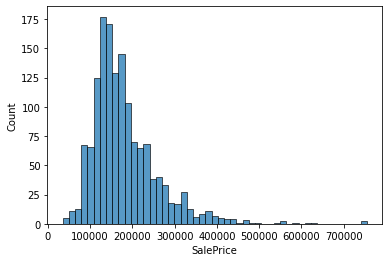

In [ ]:
sns.histplot(x='SalePrice', data=houses)

We have some outliers above 600000. Let's check them:

In [ ]:
houses[houses['SalePrice'] > 600000].filter(['SalePrice','GrLivArea','OverallQual'])

,SalePrice,GrLivArea,OverallQual
691,755000,4316,10
898,611657,2364,9
1169,625000,3627,10
1182,745000,4476,10


Each of those rows seem valid.

## Pairplot

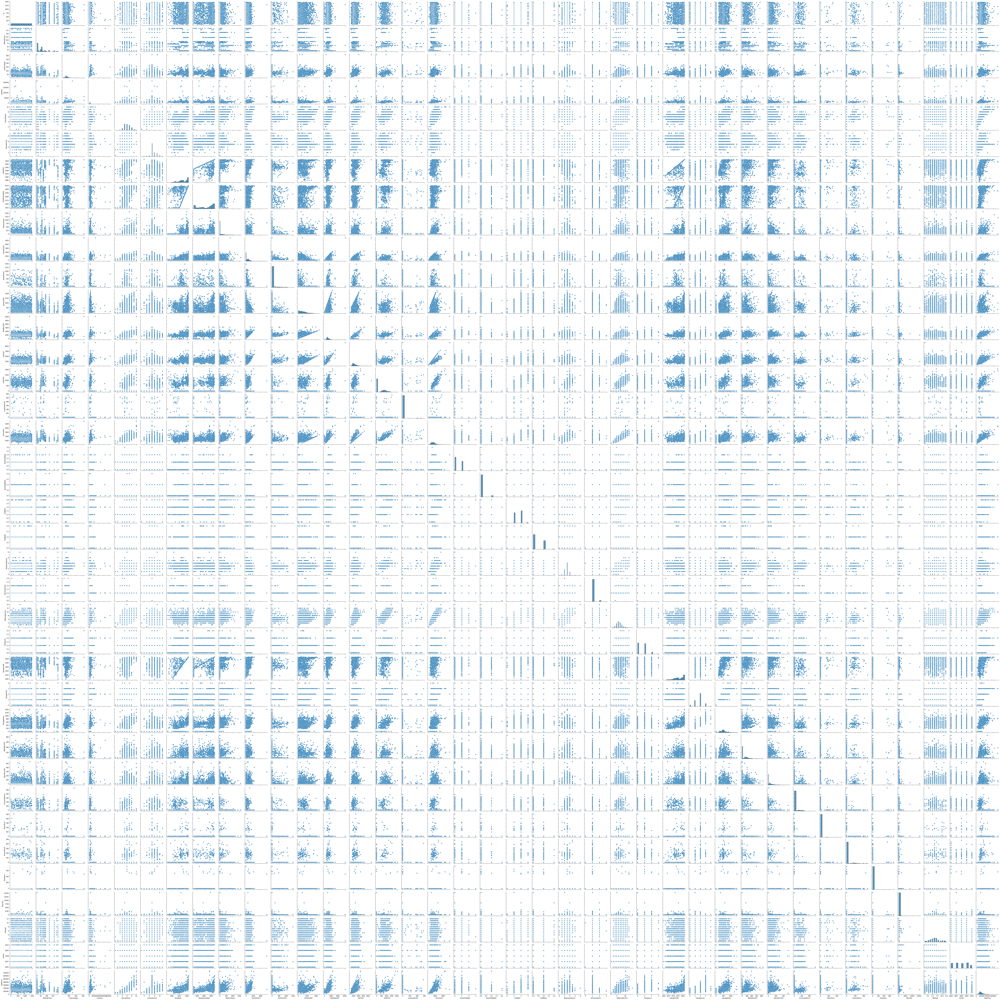

In [ ]:
# ~22 minutes (!!!)
sns.pairplot(houses)

# Conclusions
Data integrity checks found very few inconsisent data:


*   For [MasVnrType](https://colab.research.google.com/drive/19OmxE6fpd5OICQ6I4uS4u2emJN_q0oJx#scrollTo=7iHVQAZDI7zB&line=1&uniqifier=1) which could be easily fixed by replacing Nan value with 'None'
*   For [Electrical](https://colab.research.google.com/drive/19OmxE6fpd5OICQ6I4uS4u2emJN_q0oJx#scrollTo=4shrFEv1MuWI&line=4&uniqifier=1) which could be fixed by removing the row

